Dataset Selection: 

Because the dataset is composed of images, Static Plot 1 is a visualization of random images with category labels. Each time the code is ran a different set of images from the files are chosen. 





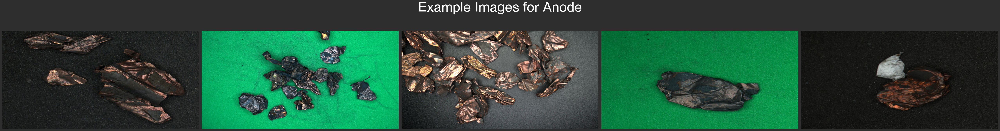

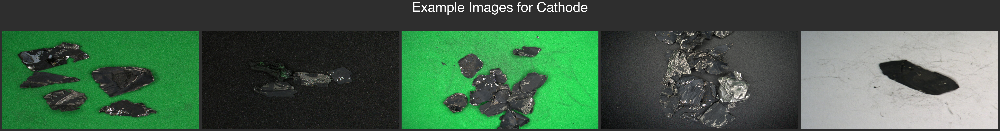

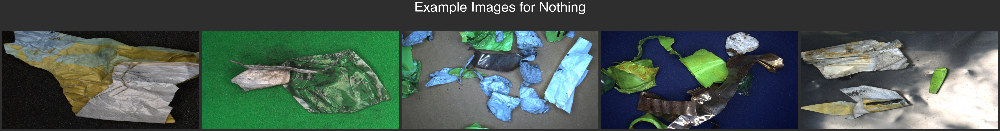

In [4]:
import os
import matplotlib.pyplot as plt
import random
from PIL import Image

# Set the path to the SLiBR dataset
dataset_path = '/Users/fatimatariq/Desktop/Homework3_MEMT680/SLiBR_dataset/classification'  # Update with your actual path

# Define the categories (assuming the folder names represent categories)
categories = ["anode", "cathode", "nothing"]

# Number of images to display per category
num_images_per_category = 5

# Font settings
font_name = 'Helvetica'
font_size = 50  # Adjust to increase or decrease font size

# Background color settings
fig_bg_color = '#2e2e2e'  # Dark gray for the figure background
subplot_bg_color = '#3b3b3b'  # Slightly lighter gray for the subplot backgrounds

# Image dimensions based on the provided image size
img_width, img_height = 2048, 1365  # Width and height of the images in pixels

# Scale factor to convert image pixels to display inches
scale_factor = 0.005  # Adjusted scale factor for a better fit

# Calculate figure dimensions based on image dimensions and number of images
fig_width = img_width * scale_factor * num_images_per_category  # Total width for all images in a row
fig_height = img_height * scale_factor  # Height for each row

# Iterate over each category and create a separate plot for each
for category in categories:
    category_path = os.path.join(dataset_path, category)
    if os.path.exists(category_path):
        # Get a list of images in the category folder
        image_files = [f for f in os.listdir(category_path) if f.endswith('.jpg')]
        
        # Select random images
        selected_images = random.sample(image_files, min(num_images_per_category, len(image_files)))
        
        # Create a figure for this category
        fig, axes = plt.subplots(1, num_images_per_category, figsize=(fig_width, fig_height))
        fig.patch.set_facecolor(fig_bg_color)  # Set figure background color
        fig.suptitle(f"Example Images for {category.capitalize()}", fontsize=font_size, fontweight='bold', color='white', fontname=font_name)

        # Plot each selected image
        for j, img_file in enumerate(selected_images):
            img_path = os.path.join(category_path, img_file)
            img = Image.open(img_path)
            
            # Display the image in the appropriate subplot without stretching
            ax = axes[j]
            ax.imshow(img)
            ax.axis('off')
            ax.set_aspect('auto')
            ax.set_facecolor(subplot_bg_color)  # Set subplot background color
            
            # Add a border around each image
            for spine in ax.spines.values():
                spine.set_edgecolor('#ffffff')  # White border color to match dark background
                spine.set_linewidth(1.2)

        # Adjust layout to reduce white space and improve spacing between subplots
        plt.subplots_adjust(wspace=0.05, hspace=0.1)  # Fine-tune horizontal and vertical space between images
        plt.tight_layout(rect=[0, 0, 1, 0.9])  # Adjust the layout to include title space
        plt.show()
